In [1]:
import utilities as ut
import estimation 
import seaborn as sns
import matplotlib.pyplot as plt

Retreive the dataset for this task

In [2]:
data = ut.retrieve_data()

features = ut.extract_features(data)
target = data.target.values


The data are represented in 27 numeric attributes (HSB histograms) and consist of 50,000 instances, divided into 1508 outliers (3.04%) and 48492 inliers (96.98%). This database contains 466 duplicates all belonging to inliers.

In [6]:
ut.describe_data(data)

,hist_0,hist_1,hist_2,hist_3,hist_4,hist_5,hist_6,hist_7,hist_8,hist_9,...,hist_18,hist_19,hist_20,hist_21,hist_22,hist_23,hist_24,hist_25,hist_26,target
index,,,,,,,,,,,,,,,,,,,,,
count,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,...,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,0.899869,0.002935,0.000162,0.002165,0.001503,0.000455,0.000028,0.000044,0.000125,0.019704,...,0.005664,0.000142,0.000002,0.008980,0.004107,0.000130,0.005521,0.009219,0.015468,0.030160
std,0.080882,0.012711,0.002093,0.010481,0.006335,0.003146,0.000781,0.000521,0.001526,0.027425,...,0.019290,0.001507,0.000104,0.019875,0.009557,0.000791,0.016900,0.017319,0.031761,0.171029
min,0.408429,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.855332,0.000000,0.000000,0.000011,0.000000,0.000000,0.000000,0.000000,0.000000,0.002150,...,0.000000,0.000000,0.000000,0.000029,0.000136,0.000000,0.000000,0.000267,0.000170,0.000000
50%,0.922028,0.000020,0.000000,0.000151,0.000016,0.000000,0.000000,0.000000,0.000000,0.009630,...,0.000020,0.000000,0.000000,0.000884,0.000990,0.000011,0.000025,0.002317,0.001901,0.000000
75%,0.961534,0.000504,0.000000,0.000816,0.000373,0.000000,0.000000,0.000000,0.000000,0.025960,...,0.002215,0.000014,0.000000,0.007908,0.003954,0.000075,0.001307,0.010222,0.015320,0.000000
max,1.000000,0.246001,0.085418,0.389667,0.140847,0.105959,0.154695,0.027271,0.057825,0.359963,...,0.295033,0.087454,0.011022,0.220258,0.210542,0.056392,0.246541,0.194675,0.327949,1.000000
mad,0.070849,0.000030,0.000000,0.000225,0.000023,0.000000,0.000000,0.000000,0.000000,0.013061,...,0.000030,0.000000,0.000000,0.001310,0.001438,0.000017,0.000037,0.003408,0.002819,0.000000


We can see that data doesn't contain any missing values all features taking their value between 0 and 1 so we don't need to scale and normalize our input

In [7]:
data.target.value_counts()

0    48492
1     1508
Name: target, dtype: int64

We see that we have about 48500 inliers and only 1508 outliers for our task. Lets look at pairwise plots for the data set and to the correlations between fratures

<Figure size 1800x1800 with 0 Axes>

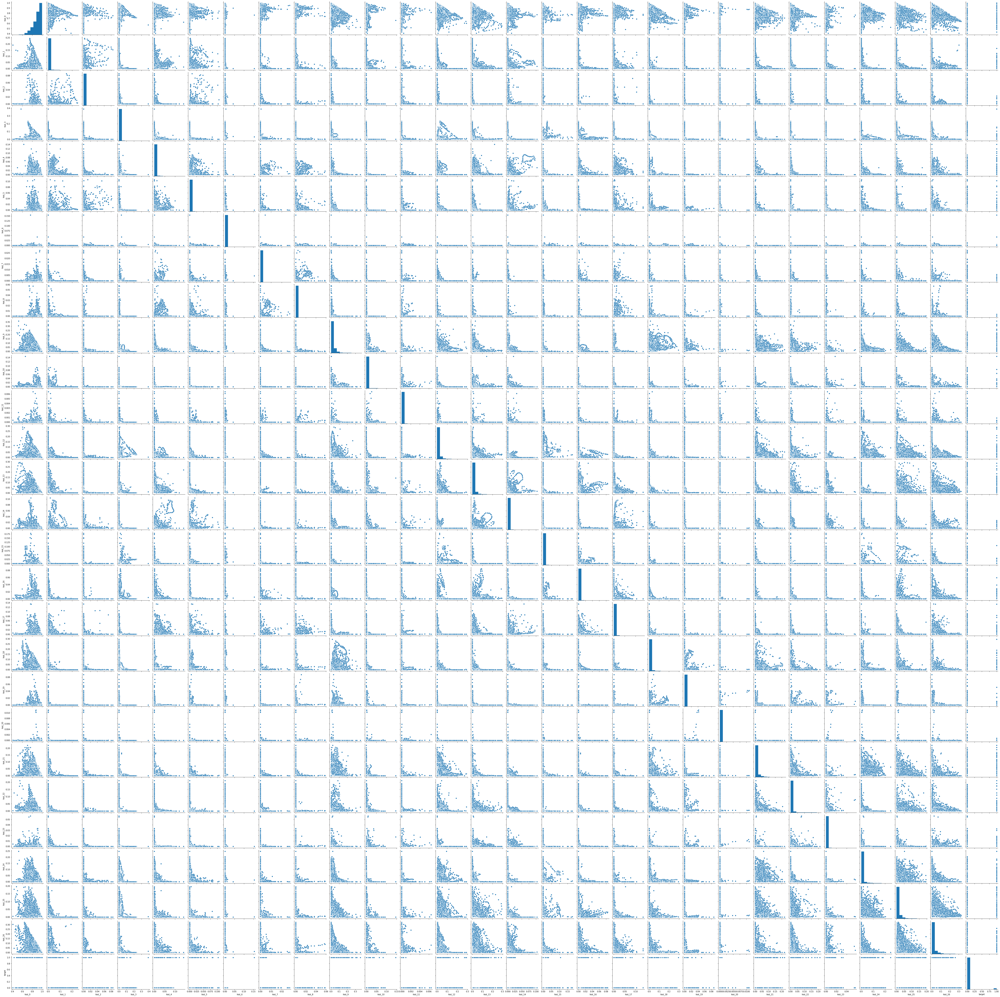

In [8]:
plt.figure(figsize=(25,25))
sns.pairplot(data);

Lots of features demonstrate us possibility to find out outliers. F.e. hist_6, hist_7 and so on. Let's check correlation between features

In [9]:
data.corr()

,hist_0,hist_1,hist_2,hist_3,hist_4,hist_5,hist_6,hist_7,hist_8,hist_9,...,hist_18,hist_19,hist_20,hist_21,hist_22,hist_23,hist_24,hist_25,hist_26,target
hist_0,1.000000,-0.131903,-0.065168,-0.139879,-0.165157,-0.114598,-0.032099,-0.022497,-0.028618,-0.403296,...,-0.296482,-0.069516,-0.004889,-0.400742,-0.364817,-0.150897,-0.337391,-0.505171,-0.480887,-0.023972
hist_1,-0.131903,1.000000,0.450003,-0.010952,0.269793,0.370245,0.007813,0.010069,0.016586,-0.099800,...,-0.038069,-0.010617,-0.001498,-0.069702,-0.058009,0.056397,-0.039469,-0.062215,0.008394,0.004798
hist_2,-0.065168,0.450003,1.000000,-0.001766,0.010702,0.447411,0.036565,0.014208,0.021837,-0.044803,...,-0.015878,-0.003648,0.002396,-0.026957,-0.026291,0.003619,-0.004470,-0.030566,-0.010361,-0.007749
hist_3,-0.139879,-0.010952,-0.001766,1.000000,0.044261,0.001990,0.065415,0.064674,0.007268,-0.078703,...,-0.027300,-0.007142,-0.001807,-0.062601,-0.054300,-0.014174,0.018461,-0.006959,-0.023110,0.012874
hist_4,-0.165157,0.269793,0.010702,0.044261,1.000000,0.321764,0.014477,0.232444,0.306369,-0.093969,...,-0.023224,-0.001606,-0.003006,-0.069588,-0.043311,0.006510,-0.030615,-0.042191,0.026251,0.006541
hist_5,-0.114598,0.370245,0.447411,0.001990,0.321764,1.000000,0.073743,0.047960,0.186843,-0.068670,...,0.019187,0.035146,0.002602,-0.039020,-0.040686,0.016814,0.000947,-0.043031,0.021065,0.008906
hist_6,-0.032099,0.007813,0.036565,0.065415,0.014477,0.073743,1.000000,0.095260,0.043379,-0.010486,...,0.044864,0.064823,0.007144,-0.007236,-0.011054,0.008451,0.012765,-0.009425,0.000557,0.028760
hist_7,-0.022497,0.010069,0.014208,0.064674,0.232444,0.047960,0.095260,1.000000,0.440682,-0.035270,...,-0.004988,0.005990,0.007179,-0.026223,-0.015568,0.006133,-0.002887,-0.018057,0.006211,-0.007858
hist_8,-0.028618,0.016586,0.021837,0.007268,0.306369,0.186843,0.043379,0.440682,1.000000,-0.044282,...,0.001975,0.041815,0.011677,-0.030592,-0.024355,0.020739,-0.008121,-0.030362,0.007885,-0.012491
hist_9,-0.403296,-0.099800,-0.044803,-0.078703,-0.093969,-0.068670,-0.010486,-0.035270,-0.044282,1.000000,...,0.386360,0.084199,-0.003832,0.196380,0.192651,0.001899,-0.015042,-0.026003,-0.114617,0.023449


Let's visualise these correlation with heatmap to see most important correlations. It's hard to judge on juss table.

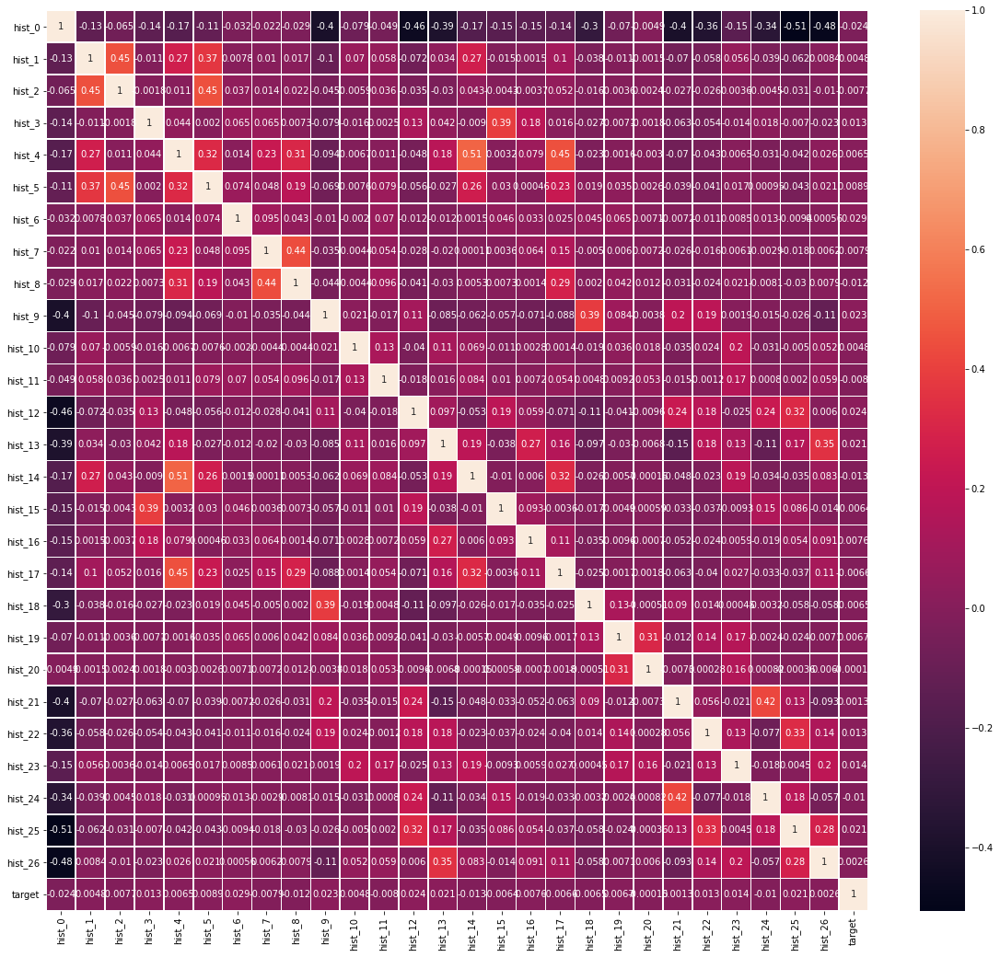

In [10]:
plt.figure(figsize=(20,18))
sns.heatmap(data.corr(), linewidths=0.5, annot=True);

We could see that we have some features strongly correlated to each other but none of them with really high correlation which could be sign to exclude some features. Then we take a look to spearman correlations. Lets take a look at the heatmap

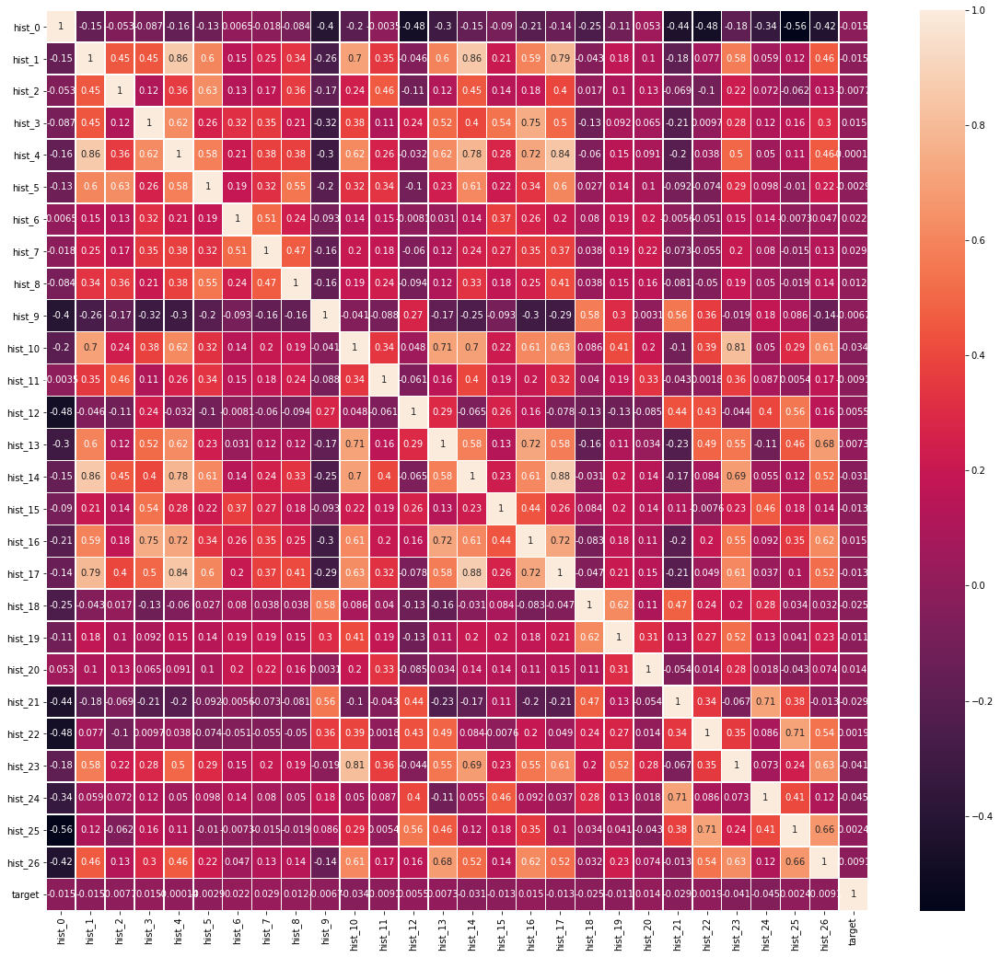

In [11]:
plt.figure(figsize=(20,18))
sns.heatmap(data.corr(method='spearman'), linewidths=0.5, annot=True);

Here we could see much more strongly correlated features which is expected cause every feature is representation of one of the HSB for one picture. Maybe we could exclude some features cause of strong correlation (hist_14, hist_15 strongly correlated with hist_1 and hist_10 with hist_23)
None of feature has strong correlation with target so for the first iteration I prefer to take all the feature set

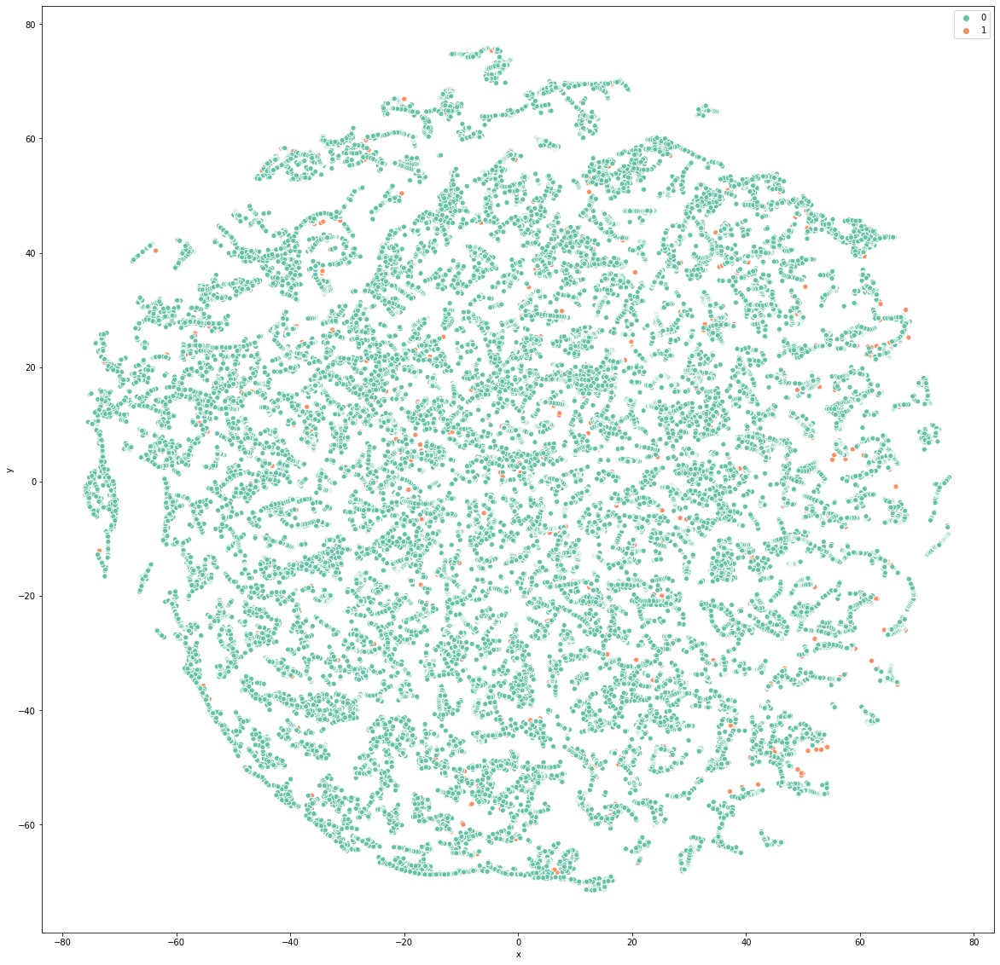

In [12]:
ut.plot_low_dimensions(ut.calculate_tsne(features), target)

This attempt wasn't really good cause we can't clearly separate outliers points from inliers on this picture

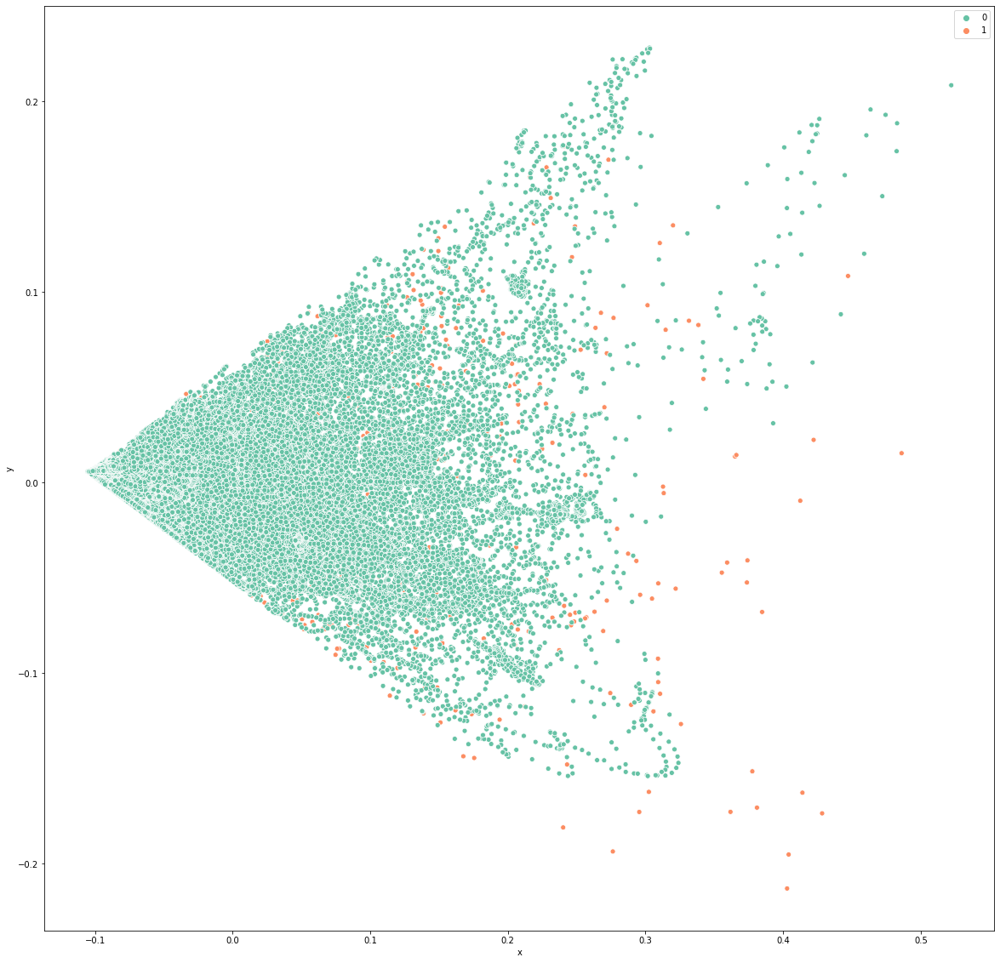

In [5]:
ut.plot_low_dimensions(ut.calculate_pca(features), target);

This picture don't give us a reaaly good opportunity but here we can see outliers like real ouliers. Next we would use our data set to perform basic supervised algorythms

ROC AUC: 0.770, PR AUC: 0.333, F1 Score: 0.123


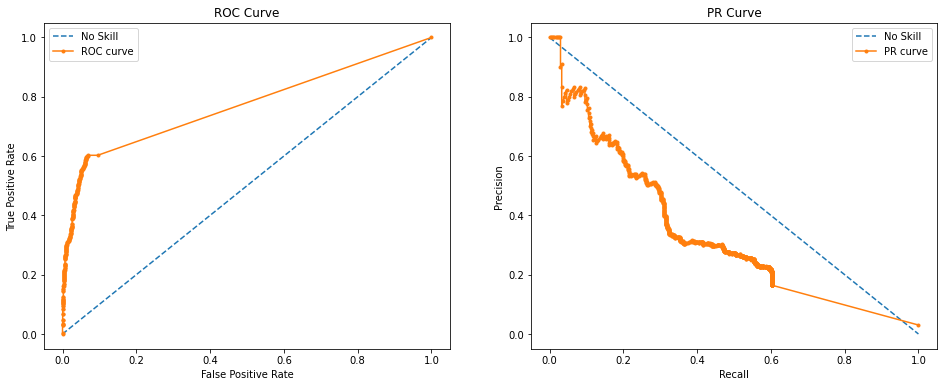

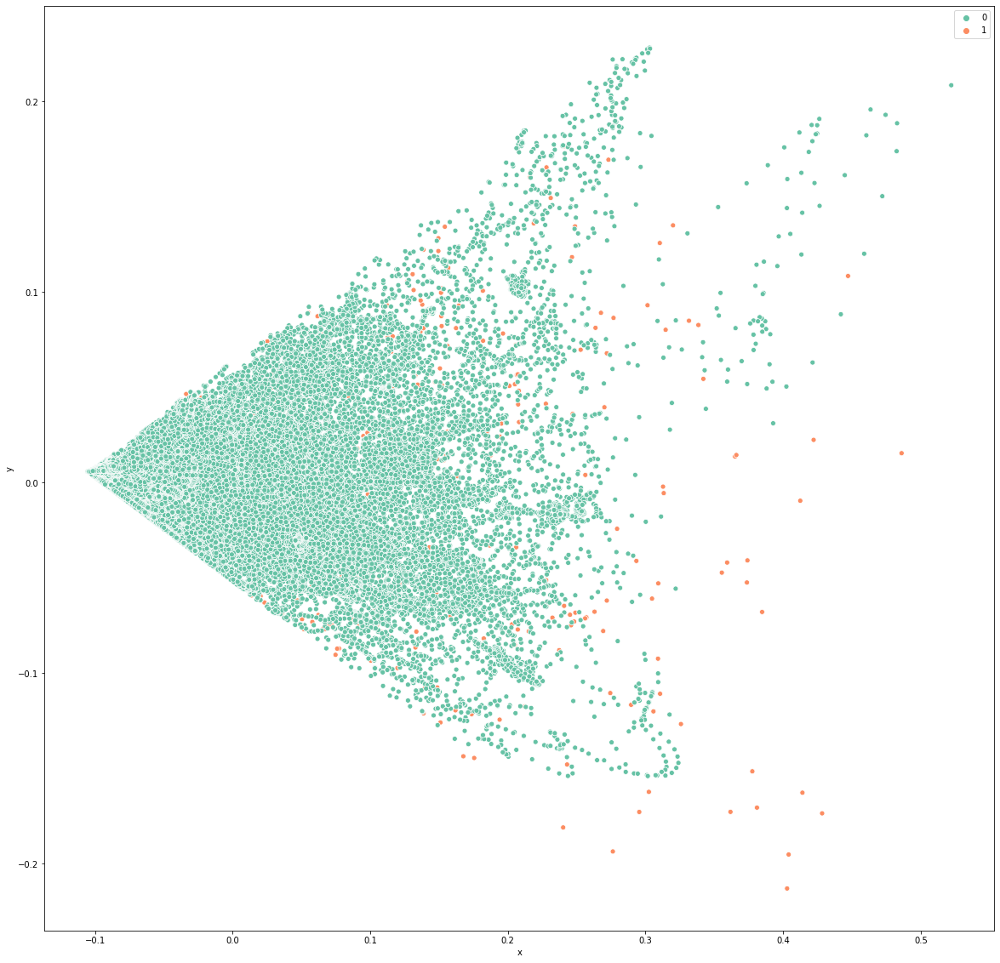

In [3]:
knn = estimation.KNNEstimator(features, target)
metrics_list = knn.supervised_pipeline()
print('ROC AUC: {:.3f}, PR AUC: {:.3f}, F1 Score: {:.3f}'. format(*metrics_list))

the most great performing estimation and most closest to the original data distribution

ROC AUC: 0.543, PR AUC: 0.057, F1 Score: 0.000


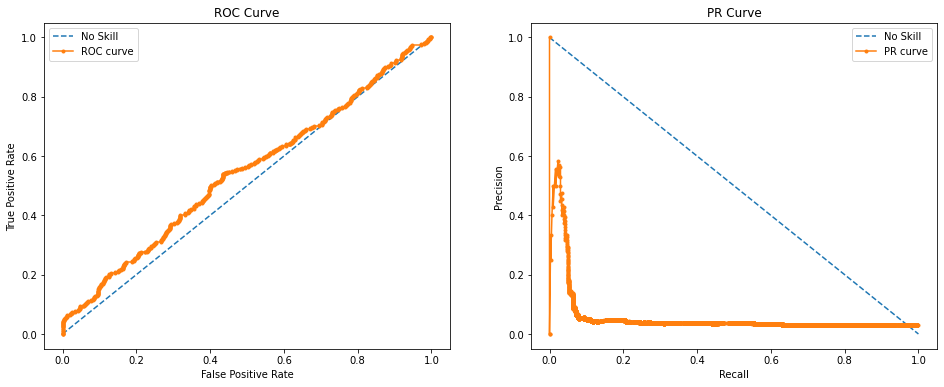

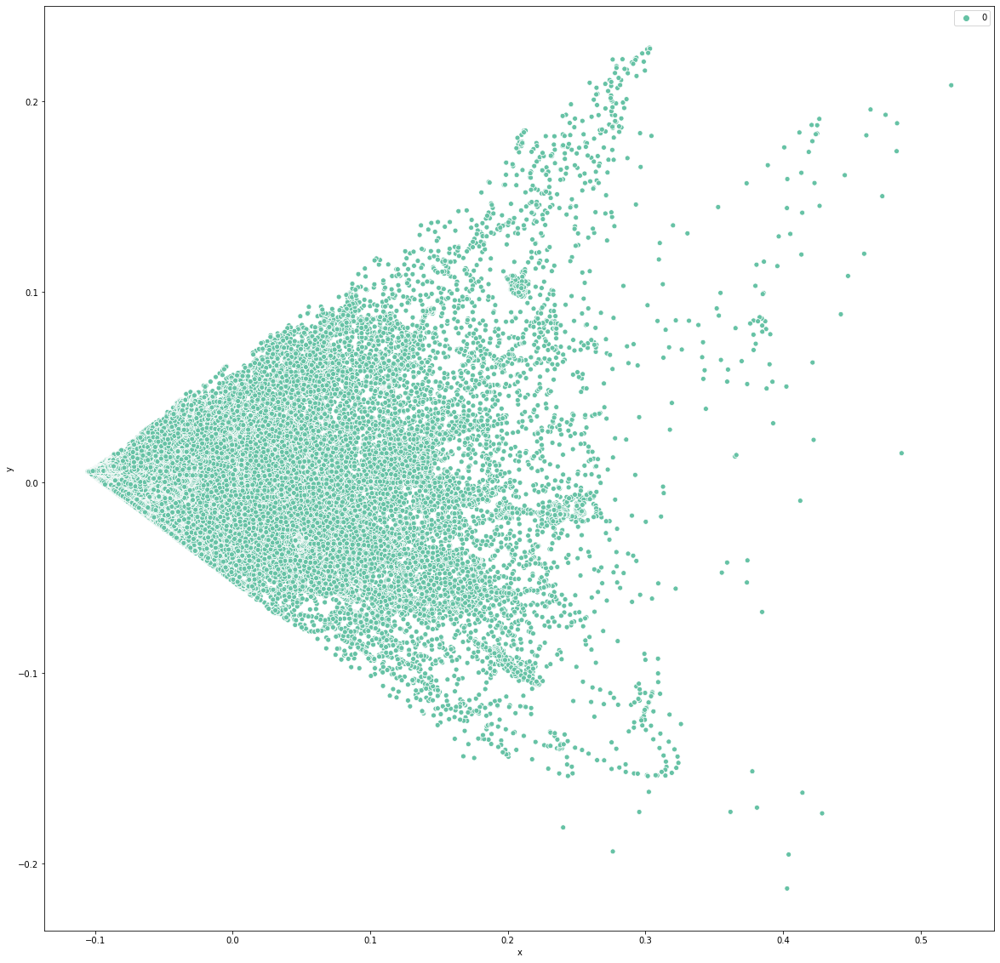

In [4]:
log_reg = estimation.LogisticRegressionEstimator(features, target)
metrics_list = log_reg.supervised_pipeline()
print('ROC AUC: {:.3f}, PR AUC: {:.3f}, F1 Score: {:.3f}'. format(*metrics_list))

ROC AUC: 0.564, PR AUC: 0.090, F1 Score: 0.000


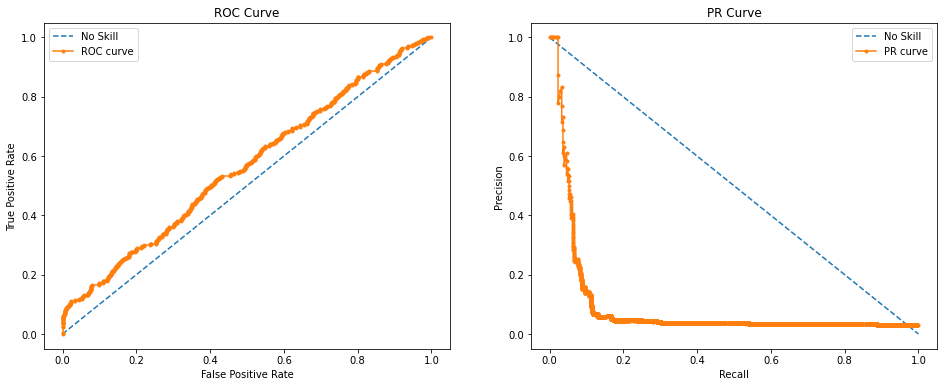

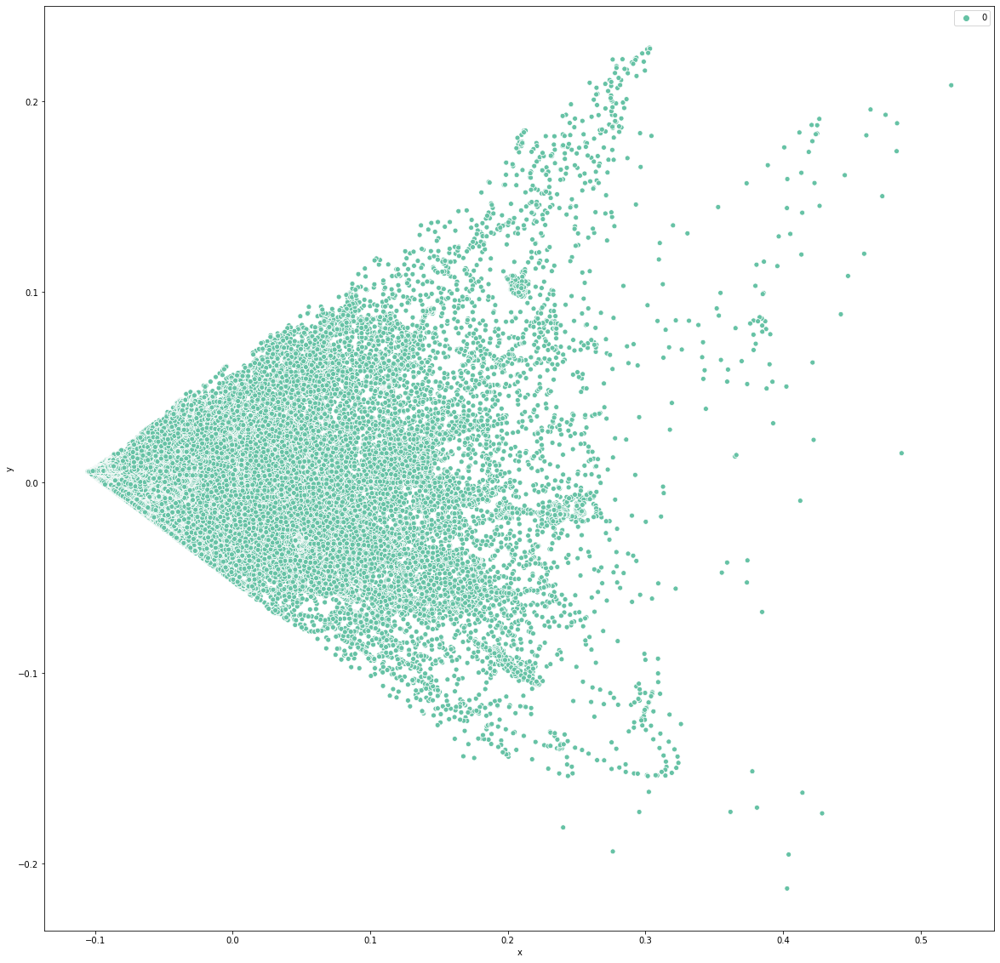

In [5]:
svm = estimation.SVMEstimator(features, target)
metrics_list = svm.supervised_pipeline()
print('ROC AUC: {:.3f}, PR AUC: {:.3f}, F1 Score: {:.3f}'. format(*metrics_list))

ROC AUC: 0.561, PR AUC: 0.094, F1 Score: 0.000


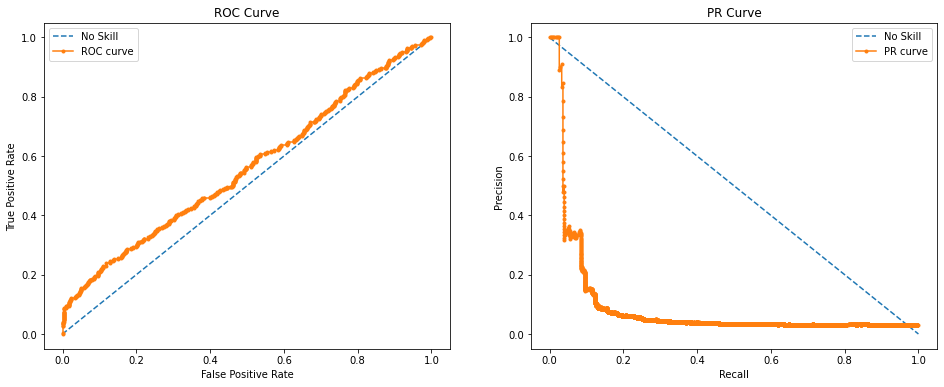

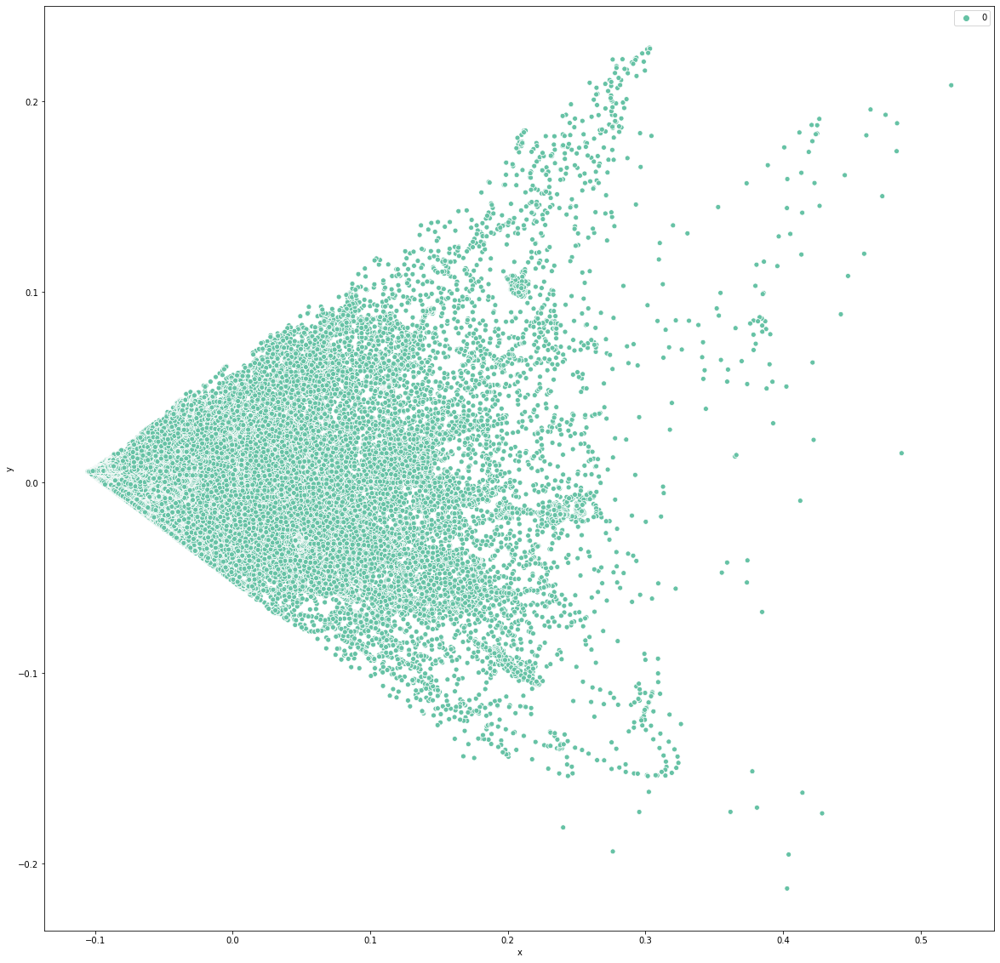

In [6]:
lgb = estimation.BoostingMachineEstimator(features, target)
metrics_list = svm.supervised_pipeline()
print('ROC AUC: {:.3f}, PR AUC: {:.3f}, F1 Score: {:.3f}'. format(*metrics_list))

We could see that the most valueable model is knn other models with hyperparameters tuning performs poorly. Due to specific of predictions we see any examples of outliers only on knn visualisation All the models was tuned and processed through pipelines. Next will take a look at unsupervised models

100%|██████████| 10/10 [01:16<00:00,  7.67s/trial, best loss: -2319.8820937320784]
ARI: -0.000, MI: 0.000, AMI: -0.000, NMI: 0.000, calinski_harabasz: 2081.296, silhouette: 0.429


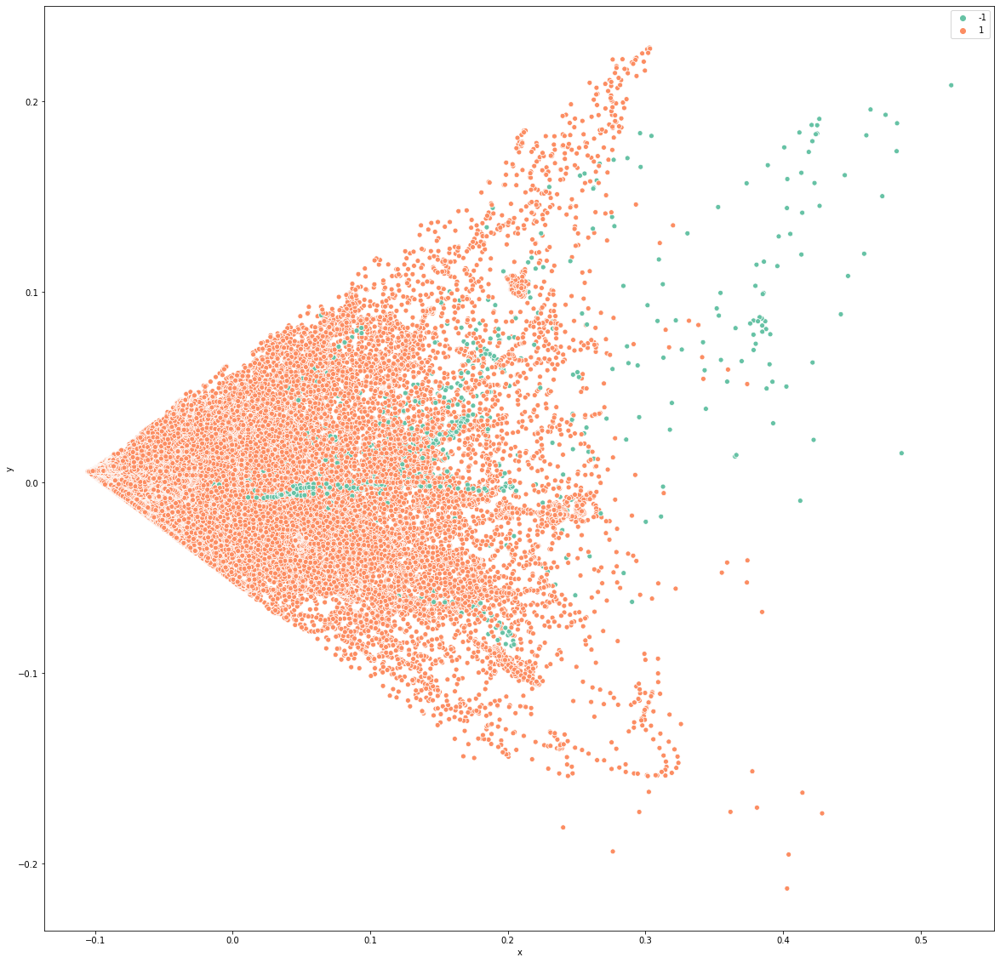

In [3]:
iso_forest = estimation.IsolationForestEstimator(features, target)
metrics_list = iso_forest.unsupervised_estimation()
print('ARI: {:.3f}, MI: {:.3f}, AMI: {:.3f}, NMI: {:.3f}, calinski_harabasz: {:.3f}, silhouette: {:.3f}'.format(
*metrics_list))

One of the best estimations that based only on features without labels, we see that it colse enough to original data distribution

100%|██████████| 5/5 [19:54<00:00, 238.85s/trial, best loss: 1.0]
ARI: 0.000, MI: 0.000, AMI: 0.000, NMI: 0.000, calinski_harabasz: 0.000, silhouette: 0.000


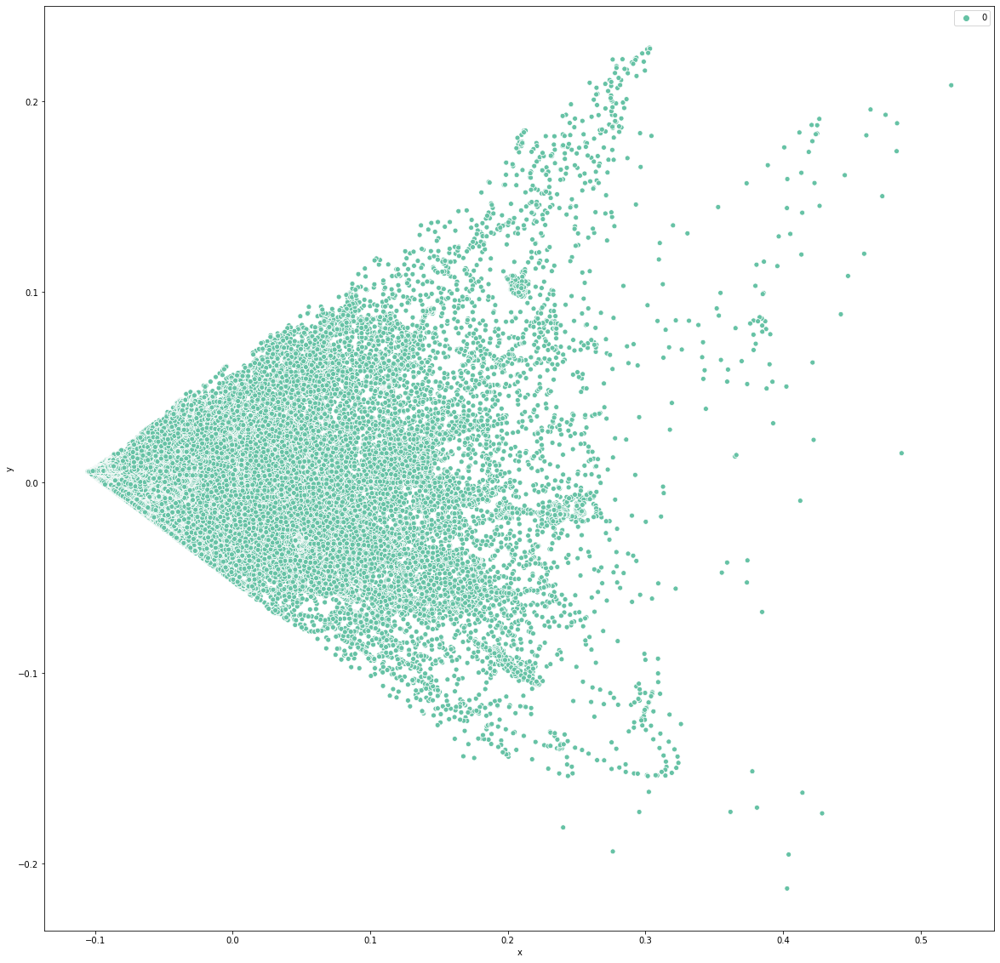

In [3]:
dbscan = estimation.DBScanEstimator(features, target)
metrics_list = dbscan.unsupervised_estimation()
print('ARI: {:.3f}, MI: {:.3f}, AMI: {:.3f}, NMI: {:.3f}, calinski_harabasz: {:.3f}, silhouette: {:.3f}'.format(
*metrics_list))

dbscan didn't find any outliers at all. A lot of options has been estimated, but it couldn't converge.

100%|██████████| 5/5 [08:24<00:00, 100.86s/trial, best loss: -2318.5722611398623]
ARI: 0.006, MI: 0.000, AMI: 0.000, NMI: 0.000, calinski_harabasz: 2318.572, silhouette: 0.366


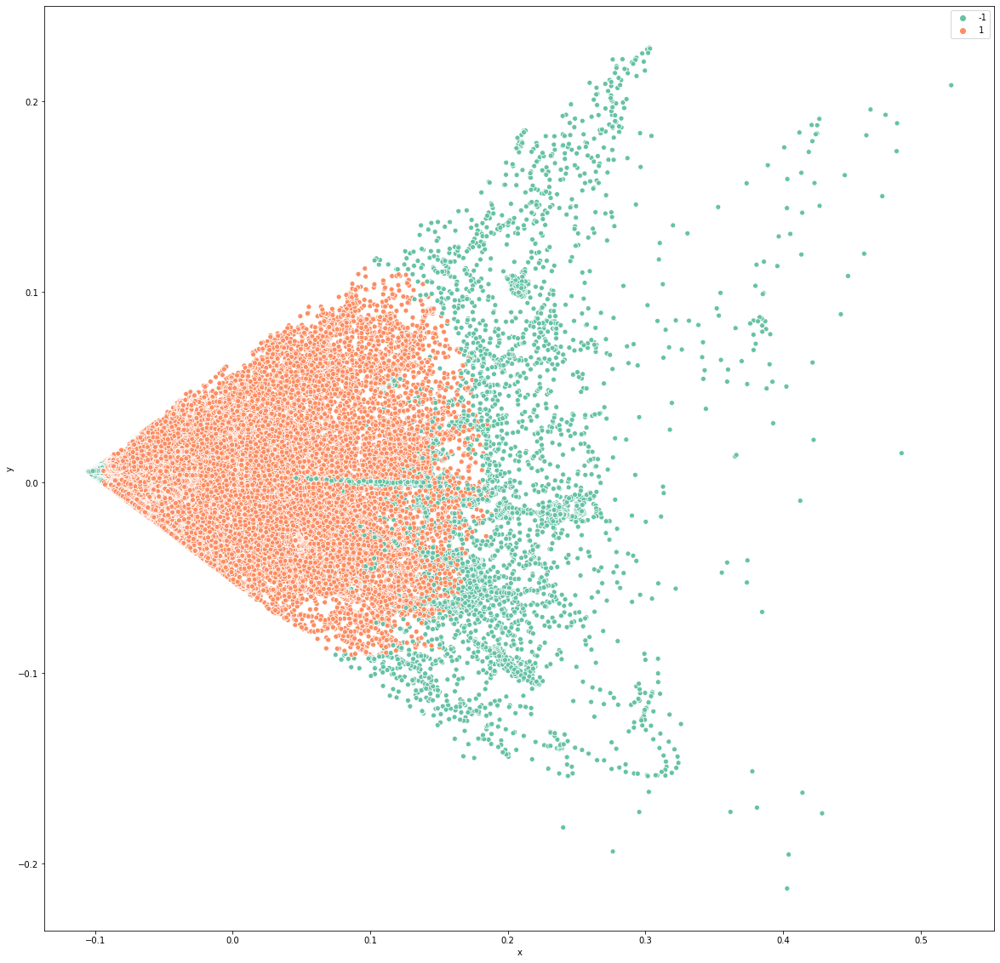

In [5]:
onesvm = estimation.OneClassSVMEstimator(features, target)
metrics_list = onesvm.unsupervised_estimation()
print('ARI: {:.3f}, MI: {:.3f}, AMI: {:.3f}, NMI: {:.3f}, calinski_harabasz: {:.3f}, silhouette: {:.3f}'.format(
*metrics_list))

Here we see a really poor quality of performing oulier detection. Basically one class svm just divide data in two clusters

100%|██████████| 5/5 [00:13<00:00,  2.71s/trial, best loss: -177.32680076882372]
ARI: 0.096, MI: 0.004, AMI: 0.022, NMI: 0.022, calinski_harabasz: 177.327, silhouette: 0.153


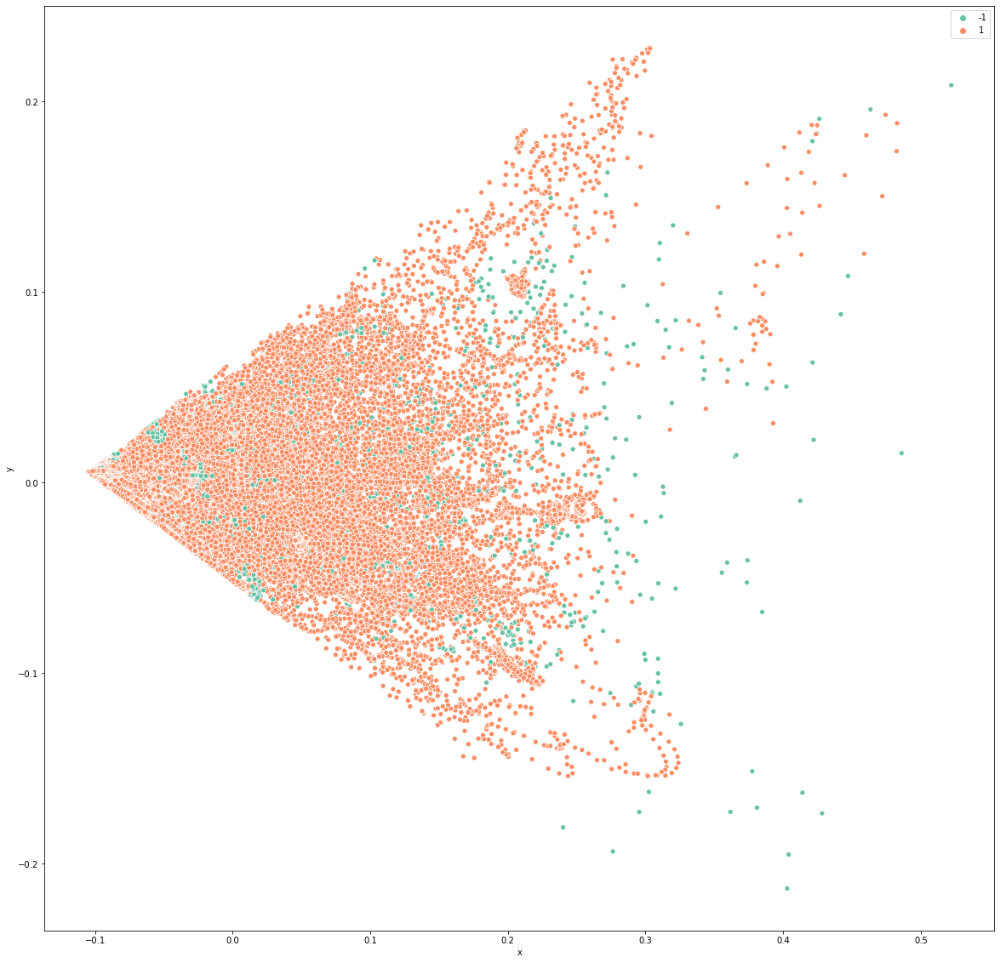

In [3]:
localoutlier = estimation.LocalOutlierFactorEstimator(features, target)
metrics_list = localoutlier.unsupervised_estimation()
print('ARI: {:.3f}, MI: {:.3f}, AMI: {:.3f}, NMI: {:.3f}, calinski_harabasz: {:.3f}, silhouette: {:.3f}'.format(
*metrics_list))

Local ouliers performs pretty good for this dataset but poorly than knn or isolation forest

Overall we can see that the most appropriate quality we gain using knn algorythms but it have to get label to perform work correctly
From unsupervised part one of the most confident is Isolation Forest algorythm.
Futher actions:
- try another approaches to detect outliers
- try some data transformation to see outliers clearer
- try other approaches for dimensionality reduction